In [1]:
import gzip
import matplotlib.pyplot as plt
import numpy
import random
import scipy
import tensorflow as tf
from collections import defaultdict
from scipy.spatial import distance

In [2]:
from itertools import islice

with open("lthing_data/reviews.txt") as myfile:
    head = list(islice(myfile, 1000001))

In [4]:
for i in range(len(head)):
    exec(head[i])

In [5]:
count = 0
total_count = 0
for value in reviews.values():
    total_count+=1
#     print(value['flags'])
    if(len(value['flags']) != 0):
        count+=1

In [6]:
count

41445

In [7]:
total_count

1000000

In [8]:
len(reviews)

1000000

In [9]:
userIDs = {}
itemIDs = {}
interactions = []
for item, user in reviews.keys():
    if('stars' in reviews[(item, user)].keys() and reviews[(item, user)]['stars'] >= 4.0 and len(reviews[(item, user)]['flags']) == 0):
        interactions.append((user, item))
        if not item in itemIDs: itemIDs[item] = len(itemIDs)
        if not user in userIDs: userIDs[user] = len(userIDs)

In [10]:
len(interactions)

497306

In [105]:
reviews

{('73960',
  'Elizabeth.Wong98'): {'comment': "Every evening, the brave queen of Persia, Shahrazad, goes into the Sultan's rooms and begins a weave of words, hoping to entice the Sultan to let her live another night so she can continue her story. But Shahrazad has a big problem: She is running out of stories. With a delicate stroke of luck, a cripple girl, Marjan, ventures into the harem with her Aunt to sell various wares. As her Aunt is selling things, Marjan entertains some of the children with a story. Unbeknownst to Marjan, Shahrazad's sister, Dunyazad, has heard her telling the story. Marjan is taken directly to Shahrazad and asked to recount the story. The tale keeps the queen alive another night and the queen decides to keep Marjan.\n As her helper, Marjan has to go into the city and look for tales that the Sultan has not heard. She has several close calls with the Kathun, the voracious female who rules the harem and who is set against \nShahrazad. Finally the Sultan proclaims 

In [115]:
interactions[-1]

(1377475200, 'krau0098', '13515943', 4.0)

In [109]:
len(items)

189971

In [116]:
len(userIDs)

51416

In [11]:
count

41445

In [12]:
random.shuffle(interactions)

In [120]:
interactions

[(-86400, '30oddyearsofzan', '5174', 5.0),
 (-86400, '5peasinapod', '2619901', 5.0),
 (-86400, 'ATechwreck', '5764439', 4.0),
 (-86400, 'Aimal', '87371', 4.0),
 (-86400, 'Amber_88', '1176915', 4.0),
 (-86400, 'Amber_88', '3147609', 4.0),
 (-86400, 'Amber_88', '360994', 5.0),
 (-86400, 'Amber_88', '737762', 5.0),
 (-86400, 'Amber_88', '810056', 5.0),
 (-86400, 'Amtep', '390272', 5.0),
 (-86400, 'AnissaAndrews', '14038411', 5.0),
 (-86400, 'AnissaAndrews', '6168', 4.5),
 (-86400, 'Anne51', '4269765', 4.0),
 (-86400, 'AnneliM', '126314', 4.0),
 (-86400, 'AnneliM', '1344617', 4.0),
 (-86400, 'AnneliM', '145072', 5.0),
 (-86400, 'AnneliM', '15693', 4.5),
 (-86400, 'AnneliM', '16117', 4.0),
 (-86400, 'AnneliM', '170887', 4.0),
 (-86400, 'AnneliM', '17836', 4.0),
 (-86400, 'AnneliM', '186018', 4.0),
 (-86400, 'AnneliM', '195025', 5.0),
 (-86400, 'AnneliM', '204230', 4.0),
 (-86400, 'AnneliM', '23999', 4.0),
 (-86400, 'AnneliM', '24000', 4.0),
 (-86400, 'AnneliM', '2449742', 5.0),
 (-86400, 'A

In [13]:
items = list(itemIDs.keys())

In [14]:
# BPR implementation.

In [15]:
class BPRbatch(tf.keras.Model):
    def __init__(self, K, lamb):
        super(BPRbatch, self).__init__()
        # Initialize variables
        self.betaI = tf.Variable(tf.random.normal([len(itemIDs)],stddev=0.001))
        self.gammaU = tf.Variable(tf.random.normal([len(userIDs),K],stddev=0.001))
        self.gammaI = tf.Variable(tf.random.normal([len(itemIDs),K],stddev=0.001))
        # Regularization coefficient
        self.lamb = lamb

    # Prediction for a single instance
    def predict(self, u, i):
        p = self.betaI[i] + tf.tensordot(self.gammaU[u], self.gammaI[i], 1)
        return p

    # Regularizer
    def reg(self):
        return self.lamb * (tf.nn.l2_loss(self.betaI) +\
                            tf.nn.l2_loss(self.gammaU) +\
                            tf.nn.l2_loss(self.gammaI))
    
    def score(self, sampleU, sampleI):
        u = tf.convert_to_tensor(sampleU, dtype=tf.int32)
        i = tf.convert_to_tensor(sampleI, dtype=tf.int32)
        beta_i = tf.nn.embedding_lookup(self.betaI, i)
        gamma_u = tf.nn.embedding_lookup(self.gammaU, u)
        gamma_i = tf.nn.embedding_lookup(self.gammaI, i)
        x_ui = beta_i + tf.reduce_sum(tf.multiply(gamma_u, gamma_i), 1)
        return x_ui

    def call(self, sampleU, sampleI, sampleJ):
        x_ui = self.score(sampleU, sampleI)
        x_uj = self.score(sampleU, sampleJ)
        return -tf.reduce_mean(tf.math.log(tf.math.sigmoid(x_ui - x_uj)))

In [16]:
optimizer = tf.keras.optimizers.Adam(0.1)
# modelBPR = BPRbatch(10, 0.0001)

In [17]:
nTrain = int(len(interactions) * 0.9)
nTest = len(interactions) - nTrain
interactionsTrain = interactions[:nTrain]
interactionsTest = interactions[nTrain:]

In [18]:
interactionsvalid = interactionsTest[:30000]
interactionsTest = interactionsTest[30000:]

In [19]:
len(interactionsTrain)

447575

In [38]:
def trainingStepBPR(model, interactions):
    Nsamples = 200000
    with tf.GradientTape() as tape:
        sampleU, sampleI, sampleJ = [], [], []
        for _ in range(Nsamples):
            u,i = random.choice(interactions) # positive sample
            j = random.choice(items) # negative sample
            while j in itemsPerUser[u]:
                j = random.choice(items)
            sampleU.append(userIDs[u])
            sampleI.append(itemIDs[i])
            sampleJ.append(itemIDs[j])

        loss = model(sampleU,sampleI,sampleJ)
        loss += model.reg()
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients((grad, var) for
                              (grad, var) in zip(gradients, model.trainable_variables)
                              if grad is not None)
    return loss.numpy()

In [21]:
# import json
# with open('interactionsTrainLThing.txt', 'w') as f:
#     f.write(json.dumps(interactionsTrain))

In [22]:
# import json
# with open('interactionsTestLThing.txt', 'w') as f:
#     f.write(json.dumps(interactionsTest))

In [23]:
itemsPerUser = defaultdict(list)
usersPerItem = defaultdict(list)
for u,i in interactionsTrain:
    itemsPerUser[u].append(i)
    usersPerItem[i].append(u)

In [24]:
interactionsTestPerUser = defaultdict(set)
itemSet = set()
for u,i in interactionsTest:
    interactionsTestPerUser[u].add(i)
    itemSet.add(i)

In [25]:
interactionsValidPerUser = defaultdict(set)
itemSetValid = set()
for u,i in interactionsvalid:
    interactionsValidPerUser[u].add(i)
    itemSetValid.add(i)

In [26]:
def AUCu(model, u, N, interactions, itemSet):
    win = 0
    if N > len(interactions[u]):
        N = len(interactions[u])
    positive = random.sample(interactions[u],N)
    negative = random.sample(itemSet.difference(interactions[u]),N)
    for i,j in zip(positive,negative):
        si = model.predict(userIDs[u], itemIDs[i]).numpy()
        sj = model.predict(userIDs[u], itemIDs[j]).numpy()
        if si > sj:
            win += 1
    return win/N

In [215]:
interactions

[(-86400, '30oddyearsofzan', '5174', 5.0),
 (-86400, '5peasinapod', '2619901', 5.0),
 (-86400, 'ATechwreck', '5764439', 4.0),
 (-86400, 'Aimal', '87371', 4.0),
 (-86400, 'Amber_88', '1176915', 4.0),
 (-86400, 'Amber_88', '3147609', 4.0),
 (-86400, 'Amber_88', '360994', 5.0),
 (-86400, 'Amber_88', '737762', 5.0),
 (-86400, 'Amber_88', '810056', 5.0),
 (-86400, 'Amtep', '390272', 5.0),
 (-86400, 'AnissaAndrews', '14038411', 5.0),
 (-86400, 'AnissaAndrews', '6168', 4.5),
 (-86400, 'Anne51', '4269765', 4.0),
 (-86400, 'AnneliM', '126314', 4.0),
 (-86400, 'AnneliM', '1344617', 4.0),
 (-86400, 'AnneliM', '145072', 5.0),
 (-86400, 'AnneliM', '15693', 4.5),
 (-86400, 'AnneliM', '16117', 4.0),
 (-86400, 'AnneliM', '170887', 4.0),
 (-86400, 'AnneliM', '17836', 4.0),
 (-86400, 'AnneliM', '186018', 4.0),
 (-86400, 'AnneliM', '195025', 5.0),
 (-86400, 'AnneliM', '204230', 4.0),
 (-86400, 'AnneliM', '23999', 4.0),
 (-86400, 'AnneliM', '24000', 4.0),
 (-86400, 'AnneliM', '2449742', 5.0),
 (-86400, 'A

In [27]:
def AUC(model, interactions, itemSet):
    av = []
    for u in interactions:
        av.append(AUCu(model, u, 10, interactions, itemSet))
    return sum(av) / len(av)

In [3]:
# lam = 0.0001
f = 5
for lam in [0.01,0.001,0.0001,0.00001, 0.000001]:
    modelBPR = BPRbatch(f, lam)
    for i in range(100):
        obj = trainingStepBPR(modelBPR, interactionsTrain)
        if (i % 10 == 9): 
            print("iteration " + str(i+1) + ", objective = " + str(obj))
    #     if (i % 20 == 9): 
    print("f", f, " Lam", lam," validation AUC = " + str(AUC(modelBPR, interactionsValidPerUser, itemSetValid)))

In [37]:
AUC(modelBPR, interactionsTestPerUser, itemSet)

0.6647980891598763

In [28]:
# SBPR Implementation.

In [39]:
socialTrust = defaultdict(set)
social_connections = open("lthing_data/edges.txt", 'r')
for l in social_connections:
    friend1, friend2 = l.strip().split(" ")
    if(socialTrust[friend1] == {}):
        socialTrust[friend1] = set(friend2)
    else:
        socialTrust[friend1].add(friend2)   
    if(socialTrust[friend2] == {}):
        socialTrust[friend2] = set(friend1)
    else:
        socialTrust[friend2].add(friend1)    

In [167]:
friends_count = []
friends1_count = []
friends2_count = []
friends3_count = []
count = 0
for users in socialTrust.keys():
    l = len(socialTrust[users])
    friends_count.append(l)
    if(l==0):
        count+=1
    if(l <= 50):
        friends3_count.append(l)
    if(l <= 400):
        friends1_count.append(l)
    else:
        friends2_count.append(users)

In [192]:
items_count = []
fc = []
count1 = 0
count2=0
for users in itemsPerUser.keys():
    l = len(itemsPerUser[users])
    items_count.append(l)
    if(l < 5):
        fc.append(len(socialTrust[users]))
        count1+=1
        
    if(l==0):
        count2+=1

In [188]:
(count1/51416)*100

67.45176598724133

In [189]:
count1

34681

In [191]:
sum(fc)/len(fc)

2.058648827888469

In [193]:
count2

3

In [198]:
(fc.count(0)/51416)*100

46.009024428193555

(array([3.4677e+04, 1.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00]),
 array([   0. ,  341.5,  683. , 1024.5, 1366. , 1707.5, 2049. , 2390.5,
        2732. , 3073.5, 3415. ]),
 <BarContainer object of 10 artists>)

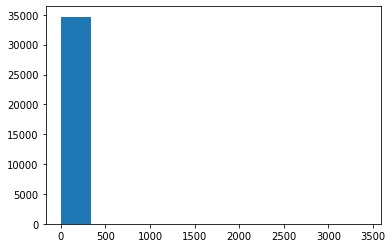

In [185]:
plt.hist(fc)

(array([5.1268e+04, 1.2200e+02, 1.9000e+01, 3.0000e+00, 4.0000e+00,
        2.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([   0. ,  238.9,  477.8,  716.7,  955.6, 1194.5, 1433.4, 1672.3,
        1911.2, 2150.1, 2389. ]),
 <BarContainer object of 10 artists>)

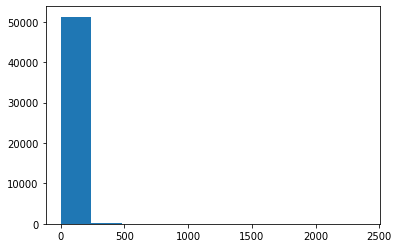

In [178]:
plt.hist(items_count)

In [168]:
count

28948

In [169]:
len(friends_count)

94894

In [150]:
len(friends1_count)

94884

In [165]:
len(friends3_count)

94131

In [166]:
94131/94884

0.9920639939294296

In [155]:
friends2_count

['theoldman',
 'edlynskey',
 'Autodafe',
 'gangleri',
 'Smethers',
 'amanaceerdh',
 'AllieW',
 'rolandperkins',
 'angrystarlyt',
 'carterchristian1']

In [160]:
for user in friends2_count:
    print(len(itemsPerUser[user]))

1
0
42
6
0
67
16
0
9
399


Text(0.5, 1.0, 'User density of social connections')

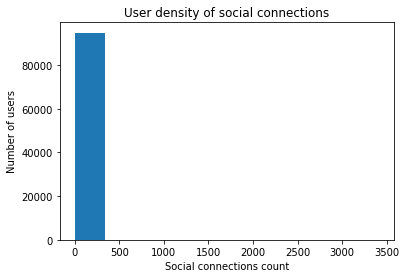

In [173]:
import numpy as np
counts, bins = np.histogram(friends_count)
plt.hist(bins[:-1], bins, weights=counts)
plt.xlabel("Social connections count")
plt.ylabel("Number of users")
plt.title("User density of social connections")

(array([9.3587e+04, 8.7700e+02, 2.3500e+02, 8.8000e+01, 3.9000e+01,
        2.0000e+01, 1.7000e+01, 1.0000e+01, 5.0000e+00, 6.0000e+00]),
 array([  0. ,  35.8,  71.6, 107.4, 143.2, 179. , 214.8, 250.6, 286.4,
        322.2, 358. ]),
 <BarContainer object of 10 artists>)

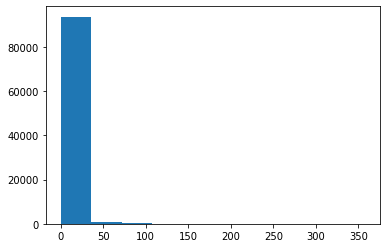

In [163]:
plt.hist(friends1_count)

In [119]:
len(socialTrust)

94894

In [211]:
common_items = []
for user in itemsPerUser.keys():
    iset = itemsPerUser[user]
    for friend in socialTrust[user]:
        if(friend in itemsPerUser.keys()):
            i1set = itemsPerUser[friend]
            common_items.append(len(iset.intersection(i1set))/iset)

In [214]:
sum(common_items)/len(common_items)

0.32198621086411316

(array([1.09581e+05, 1.25600e+03, 2.54000e+02, 7.40000e+01, 4.20000e+01,
        2.00000e+01, 4.00000e+00, 8.00000e+00, 6.00000e+00, 2.00000e+00]),
 array([ 0.,  5., 10., 15., 20., 25., 30., 35., 40., 45., 50.]),
 <BarContainer object of 10 artists>)

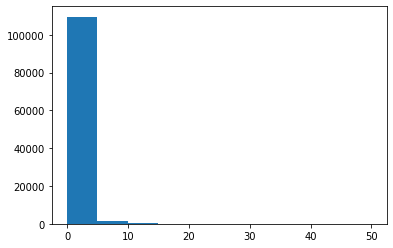

In [213]:
plt.hist(common_items)

In [205]:
socialTrust['Rodo']

{'anehan', 'dingsi', 'sevilemar', 'slash'}

In [43]:
# from itertools import islice

# with open("lthing_data/reviews.txt") as myfile:
#     head = list(islice(myfile, 100001))

In [44]:
# for i in range(len(head)):
#     exec(head[i])

In [45]:
# userIDs = {}
# itemIDs = {}
# interactions = []
# for item, user in reviews.keys():
#     if not item in itemIDs: itemIDs[item] = len(itemIDs)
#     if not user in userIDs: userIDs[user] = len(userIDs)
#     interactions.append((user, item))

In [46]:
# random.shuffle(interactions)

In [47]:
# items = list(itemIDs.keys())

In [41]:
def trainingStepBPRsocial(model, interactions):
    Nsamples = 100000
    with tf.GradientTape() as tape:
        sampleU, sampleI, sampleJ = [], [], []
        while len(sampleU) < Nsamples/2:
            try:
                u,i = random.choice(interactions) # positive sample
                v = random.sample(socialTrust[u],1)[0] # trust link
                j = random.sample(itemsPerUser[v],1)[0] # friend's item
                k = random.choice(items) # negative item
                if j in itemsPerUser[u] or k in itemsPerUser[u]:
                    continue
            except Exception as e:
                continue
            while j in itemsPerUser[u]:
                j = random.choice(items)
            sampleU.append(userIDs[u])
            sampleI.append(itemIDs[i]) # Positive
            sampleJ.append(itemIDs[j]) # greater than social
            sampleU.append(userIDs[u])
            sampleI.append(itemIDs[j]) # Social
            sampleJ.append(itemIDs[k]) # greater than negative        

        loss = model(sampleU,sampleI,sampleJ)
        loss += model.reg()
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients((grad, var) for
                              (grad, var) in zip(gradients, model.trainable_variables)
                              if grad is not None)
    return loss.numpy()

In [49]:
# random.shuffle(interactions)

In [43]:
# nTrain = int(len(interactions) * 0.9)
# nTest = len(interactions) - nTrain
# interactionsTrain = interactions[:nTrain]
# interactionsTest = interactions[nTrain:]

In [51]:
# itemsPerUser = defaultdict(list)
# usersPerItem = defaultdict(list)
# for u,i in interactionsTrain:
#     itemsPerUser[u].append(i)
#     usersPerItem[i].append(u)

In [31]:
optimizer = tf.keras.optimizers.Adam(0.1)


In [4]:
f=5
for lam in [0.01,0.001,0.0001,0.00001, 0.000001]:
    modelBPRsocial = BPRbatch(f, lam)
    for i in range(100):
        obj = trainingStepBPRsocial(modelBPRsocial, interactionsTrain)
        if (i % 10 == 9): print("iteration " + str(i+1) + ", objective = " + str(obj))
    print("f", f, " Lam", lam," validation AUC = " + str(AUC(modelBPRsocial, interactionsValidPerUser, itemSetValid)))    


In [5]:
AUC(modelBPRsocial, interactionsTestPerUser, itemSet)

In [ ]:
# FPMC

In [78]:
userIDs = {}
itemIDs = {}
interactions = []
interactionsPerUser = defaultdict(list)

# import datetime
# month = {'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6, 'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12}

for item, user in reviews.keys():
    t = reviews[(item, user)]['unixtime']
    if(not t is None and 'stars' in reviews[(item, user)].keys() and reviews[(item, user)]['stars'] >= 4.0 and len(reviews[(item, user)]['flags']) == 0):
        if not item in itemIDs: itemIDs[item] = len(itemIDs)
        if not user in userIDs: userIDs[user] = len(userIDs)
#             m = str(month[t[:3]])
#             m += t[3:]    
#             date_format = datetime.datetime.strptime(m,"%m %d, %Y")
#             unix_time = datetime.datetime.timestamp(date_format)
        r = reviews[(item, user)]['stars']
        interactions.append((t,user,item,r))
        interactionsPerUser[user].append((t,item,r))

In [79]:
interactionsPerUser

defaultdict(list,
            {'Elizabeth.Wong98': [(1332288000, '73960', 4.5),
              (1319673600, '803330', 4.5),
              (1326844800, '10157220', 5.0),
              (1319155200, '2562126', 5.0),
              (1338422400, '9050880', 5.0),
              (1338336000, '3916967', 4.5),
              (1326758400, '11190963', 5.0),
              (1326844800, '73942', 5.0),
              (1332979200, '85332', 5.0),
              (1319587200, '1552696', 4.5),
              (1332979200, '8024489', 4.0)],
             'suz.haugland': [(1299888000, '9523995', 4.0),
              (1321228800, '10783428', 4.0),
              (1325548800, '10305048', 5.0),
              (1321228800, '9716929', 5.0),
              (1309996800, '10713070', 4.0),
              (1321228800, '11099812', 4.0),
              (1302393600, '10099223', 5.0),
              (1321228800, '11173129', 5.0),
              (1326067200, '11768521', 5.0),
              (1309651200, '11171128', 5.0),
              (134

In [80]:
interactions.sort()

In [81]:
interactions

[(-86400, '30oddyearsofzan', '5174', 5.0),
 (-86400, '5peasinapod', '2619901', 5.0),
 (-86400, 'ATechwreck', '5764439', 4.0),
 (-86400, 'Aimal', '87371', 4.0),
 (-86400, 'Amber_88', '1176915', 4.0),
 (-86400, 'Amber_88', '3147609', 4.0),
 (-86400, 'Amber_88', '360994', 5.0),
 (-86400, 'Amber_88', '737762', 5.0),
 (-86400, 'Amber_88', '810056', 5.0),
 (-86400, 'Amtep', '390272', 5.0),
 (-86400, 'AnissaAndrews', '14038411', 5.0),
 (-86400, 'AnissaAndrews', '6168', 4.5),
 (-86400, 'Anne51', '4269765', 4.0),
 (-86400, 'AnneliM', '126314', 4.0),
 (-86400, 'AnneliM', '1344617', 4.0),
 (-86400, 'AnneliM', '145072', 5.0),
 (-86400, 'AnneliM', '15693', 4.5),
 (-86400, 'AnneliM', '16117', 4.0),
 (-86400, 'AnneliM', '170887', 4.0),
 (-86400, 'AnneliM', '17836', 4.0),
 (-86400, 'AnneliM', '186018', 4.0),
 (-86400, 'AnneliM', '195025', 5.0),
 (-86400, 'AnneliM', '204230', 4.0),
 (-86400, 'AnneliM', '23999', 4.0),
 (-86400, 'AnneliM', '24000', 4.0),
 (-86400, 'AnneliM', '2449742', 5.0),
 (-86400, 'A

In [82]:
itemIDs['dummy'] = len(itemIDs)

In [83]:
interactionsWithPrevious = []

for u in interactionsPerUser:
    interactionsPerUser[u].sort()
    lastItem = 'dummy'
    for (t,i,r) in interactionsPerUser[u]:
        interactionsWithPrevious.append((t,u,i,lastItem,r))
        lastItem = i

In [84]:
interactionsPerUser

defaultdict(list,
            {'Elizabeth.Wong98': [(1319155200, '2562126', 5.0),
              (1319587200, '1552696', 4.5),
              (1319673600, '803330', 4.5),
              (1326758400, '11190963', 5.0),
              (1326844800, '10157220', 5.0),
              (1326844800, '73942', 5.0),
              (1332288000, '73960', 4.5),
              (1332979200, '8024489', 4.0),
              (1332979200, '85332', 5.0),
              (1338336000, '3916967', 4.5),
              (1338422400, '9050880', 5.0)],
             'suz.haugland': [(1299888000, '9523995', 4.0),
              (1302220800, '10998784', 4.0),
              (1302393600, '10099223', 5.0),
              (1306800000, '11048267', 5.0),
              (1307404800, '10484440', 4.0),
              (1308182400, '10718640', 4.0),
              (1309651200, '11171128', 5.0),
              (1309996800, '10713070', 4.0),
              (1321228800, '10675806', 5.0),
              (1321228800, '10739931', 5.0),
              (13

In [85]:
itemsPerUser = defaultdict(set)
for _,u,i,_ in interactions:
    itemsPerUser[u].add(i)

In [86]:
items = list(itemIDs.keys())

In [87]:
optimizer = tf.keras.optimizers.Adam(0.1)

In [88]:
class FPMC(tf.keras.Model):
    def __init__(self, K, lamb, UI = 1, IJ = 1):
        super(FPMC, self).__init__()
        # Initialize variables
        self.betaI = tf.Variable(tf.random.normal([len(itemIDs)],stddev=0.001))
        self.gammaUI = tf.Variable(tf.random.normal([len(userIDs),K],stddev=0.001))
        self.gammaIU = tf.Variable(tf.random.normal([len(itemIDs),K],stddev=0.001))
        self.gammaIJ = tf.Variable(tf.random.normal([len(itemIDs),K],stddev=0.001))
        self.gammaJI = tf.Variable(tf.random.normal([len(itemIDs),K],stddev=0.001))
        # Regularization coefficient
        self.lamb = lamb
        # Which terms to include
        self.UI = UI
        self.IJ = IJ

    # Prediction for a single instance
    def predict(self, u, i, j):
        p = self.betaI[i] + self.UI * tf.tensordot(self.gammaUI[u], self.gammaIU[i], 1) +\
                            self.IJ * tf.tensordot(self.gammaIJ[i], self.gammaJI[j], 1)
        return p

    # Regularizer
    def reg(self):
        return self.lamb * (tf.nn.l2_loss(self.betaI) +\
                            tf.nn.l2_loss(self.gammaUI) +\
                            tf.nn.l2_loss(self.gammaIU) +\
                            tf.nn.l2_loss(self.gammaIJ) +\
                            tf.nn.l2_loss(self.gammaJI))

    def call(self, sampleU, # user
                   sampleI, # item
                   sampleJ, # previous item
                   sampleK): # negative item
        u = tf.convert_to_tensor(sampleU, dtype=tf.int32)
        i = tf.convert_to_tensor(sampleI, dtype=tf.int32)
        j = tf.convert_to_tensor(sampleJ, dtype=tf.int32)
        k = tf.convert_to_tensor(sampleK, dtype=tf.int32)
        gamma_ui = tf.nn.embedding_lookup(self.gammaUI, u)
        gamma_iu = tf.nn.embedding_lookup(self.gammaIU, i)
        gamma_ij = tf.nn.embedding_lookup(self.gammaIJ, i)
        gamma_ji = tf.nn.embedding_lookup(self.gammaJI, j)
        beta_i = tf.nn.embedding_lookup(self.betaI, i)
        x_uij = beta_i + self.UI * tf.reduce_sum(tf.multiply(gamma_ui, gamma_iu), 1) +\
                         self.IJ * tf.reduce_sum(tf.multiply(gamma_ij, gamma_ji), 1)
        gamma_uk = tf.nn.embedding_lookup(self.gammaUI, u)
        gamma_ku = tf.nn.embedding_lookup(self.gammaIU, k)
        gamma_kj = tf.nn.embedding_lookup(self.gammaIJ, k)
        gamma_jk = tf.nn.embedding_lookup(self.gammaJI, j)
        beta_k = tf.nn.embedding_lookup(self.betaI, k)
        x_ukj = beta_k + self.UI * tf.reduce_sum(tf.multiply(gamma_uk, gamma_ku), 1) +\
                         self.IJ * tf.reduce_sum(tf.multiply(gamma_kj, gamma_jk), 1)
        return -tf.reduce_mean(tf.math.log(tf.math.sigmoid(x_uij - x_ukj)))

In [89]:
modelFPMC = FPMC(5, 0.001, 1, 1)
modelMF = FPMC(5, 0.001, 1, 0)
modelFMC = FPMC(5, 0.001, 0, 1)

In [90]:
def trainingStep(model, interactions):
    with tf.GradientTape() as tape:
        sampleU, sampleI, sampleJ, sampleK = [], [], [], []
        for _ in range(100000):
            _,u,i,j,_ = random.choice(interactions) # positive sample
            k = random.choice(items) # negative sample
            while k in itemsPerUser[u]:
                k = random.choice(items)
            sampleU.append(userIDs[u])
            sampleI.append(itemIDs[i])
            sampleJ.append(itemIDs[j])
            sampleK.append(itemIDs[k])

        loss = model(sampleU,sampleI,sampleJ,sampleK)
        loss += model.reg()
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients((grad, var) for
                              (grad, var) in zip(gradients, model.trainable_variables)
                              if grad is not None)
    return loss.numpy()

In [91]:
nTrain = int(len(interactions) * 0.9)
nTest = len(interactions) - nTrain
interactionsTrain = interactionsWithPrevious[:nTrain]
interactionsTest = interactionsWithPrevious[nTrain:]

In [92]:
interactionsvalid = interactionsTest[:30000]
interactionsTest = interactionsTest[30000:]

In [93]:
len(interactionsvalid)

30000

In [94]:
interactionsTestPerUser = defaultdict(set)
itemSet = set()
for _,u,i,j,_ in interactionsTest:
    interactionsTestPerUser[u].add((i,j))
    itemSet.add(i)
    itemSet.add(j)

In [95]:
interactionsValidPerUser = defaultdict(set)
itemSetValid = set()
for _,u,i,j,_ in interactionsvalid:
    interactionsValidPerUser[u].add((i,j))
    itemSetValid.add(i)
    itemSetValid.add(j)

In [99]:
def AUCu(model, u, N, interactionsTestPerUser, itemSet):
    win = 0
    if N > len(interactionsTestPerUser[u]):
        N = len(interactionsTestPerUser[u])
    positive = random.sample(interactionsTestPerUser[u],N)
    negative = random.sample(itemSet,N)
    for (i,j),k in zip(positive,negative):
        sp = model.predict(userIDs[u], itemIDs[i], itemIDs[j]).numpy()
        sn = model.predict(userIDs[u], itemIDs[k], itemIDs[j]).numpy()
        if sp > sn:
            win += 1
    return win/N

In [100]:
def AUC(model, interactionsTestPerUser, itemSet):
    av = []
    for u in interactionsTestPerUser:
        av.append(AUCu(model, u, 10, interactionsTestPerUser, itemSet))
    return sum(av) / len(av)

In [6]:
f=20
for lam in [0.01,0.001,0.0001,0.00001, 0.000001]:
    modelFPMC = FPMC(f, lam, 1, 1)
    for i in range(100):
        obj = trainingStep(modelFPMC, interactionsTrain)
        if (i % 10 == 9): print("iteration " + str(i+1) + ", objective = " + str(obj))
    print("f", f, " Lam", lam," validation AUC = " + str(AUC(modelFPMC, interactionsValidPerUser, itemSetValid)))    

In [7]:
AUC(modelFPMC, interactionsTestPerUser, itemSet)

In [8]:
# for i in range(100):
#     obj = trainingStep(modelMF, interactionsTrain)
#     if (i % 10 == 9): print("iteration " + str(i+1) + ", objective = " + str(obj))

In [9]:
f=20
for lam in [0.01,0.001,0.0001,0.00001, 0.000001]:
    modelFMC = FPMC(f, lam, 0, 1)
    for i in range(100):
        obj = trainingStep(modelFMC, interactionsTrain)
        if (i % 10 == 9): print("iteration " + str(i+1) + ", objective = " + str(obj))
    print("f", f, " Lam", lam," validation AUC = " + str(AUC(modelFMC, interactionsValidPerUser, itemSetValid)))    

In [12]:
AUC(modelFMC, interactionsTestPerUser, itemSet)

In [11]:
AUC(modelFPMC)

In [10]:
AUC(modelMF)